## **Object Detection with Faster R-CNN**

This project implements an object detection pipeline using Faster R-CNN (ResNet-50 backbone) with a custom dataset of animal classes. The pipeline includes data preprocessing, model training, evaluation (mAP, precision, recall), and visualization of bounding box predictions. The model is trained and evaluated using PyTorch and torchvision libraries.


---



In [ ]:
import os
import torch
import pandas as pd
from PIL import Image
from torchvision.transforms import functional as F
from torchvision import transforms, datasets
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torch.optim as optim
import torch.utils.data
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from PIL import ImageDraw


## **Custom PyTorch Dataset Class for Object Detection**


---



In [ ]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, root, csv_file, class_map, transforms=None, target_size=(512, 512)):
        self.root = root
        self.annotations = pd.read_csv(csv_file)
        self.class_map = class_map
        self.transforms = transforms
        self.target_size = target_size  # Target size (width, height)

        # Collect all image paths and their base file names
        self.image_paths = []
        for class_dir in os.listdir(root):  # Iterate over subdirectories in the root
            class_path = os.path.join(root, class_dir)
            if os.path.isdir(class_path):  # Ensure it's a directory
                for file in os.listdir(class_path):
                    if file.endswith(('.jpg', '.png')):  # Adjust for your image types
                        self.image_paths.append((os.path.join(class_path, file), file))

        # Create a DataFrame for image paths
        self.image_df = pd.DataFrame(self.image_paths, columns=["image_path", "image_name"])

        # Filter annotations to include only matched files
        self.annotations = self.annotations.merge(self.image_df, on="image_name", how="inner")

    def __len__(self): # Return the number of unique images in the dataset (based on image names)
        return len(self.annotations['image_name'].unique())

    def __getitem__(self, idx):# Get a specific image and its corresponding annotations by index
        row = self.annotations.iloc[idx]
        img_path = row['image_path']

        if not os.path.exists(img_path):
            raise FileNotFoundError(f"File not found: {img_path}")

        # Load the image
        image = Image.open(img_path).convert("RGB")

        # Resize the image to the target size
        resized_width, resized_height = self.target_size
        image = image.resize((resized_width, resized_height))

        # Adjust bounding boxes to the resized image
        boxes = []
        labels = []

        for _, row in self.annotations[self.annotations['image_name'] == row['image_name']].iterrows():
            # Multiply normalized bounding box values by the new dimensions
            xmin = row['Xmin'] * resized_width
            ymin = row['Ymin'] * resized_height
            xmax = row['Xmax'] * resized_width
            ymax = row['Ymax'] * resized_height
            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(self.class_map[row['label']])

        # Convert to tensors
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {"boxes": boxes, "labels": labels}

        # Apply transforms, if any
        if self.transforms:
            image = self.transforms(image)

        return image, target

    def visualize_bounding_boxes(self, num_images=5):
        for idx in range(num_images):
            # Get the annotation for the image
            row = self.annotations.iloc[idx]

            # Load the image
            img_path = row['image_path']
            img = Image.open(img_path).convert("RGB").resize(self.target_size)

            # Get bounding box coordinates
            resized_width, resized_height = self.target_size
            bbox = [
                row['Xmin'] * resized_width,
                row['Ymin'] * resized_height,
                row['Xmax'] * resized_width,
                row['Ymax'] * resized_height,
            ]
            print(f"Image: {img_path}")
            print(f"Bounding Box: {bbox}")
            print(f"Image Dimensions: {img.size}")

            # Draw the bounding box
            draw = ImageDraw.Draw(img)
            draw.rectangle(bbox, outline="red", width=3)
            draw.text((bbox[0], bbox[1] - 10), row['label'], fill="red")  # Add the label

            # Display the image
            plt.figure(figsize=(8, 8))
            plt.imshow(img)
            plt.axis("off")
            plt.show()


##**Mounting Google Drive and Loading Dataset**

This section mounts Google Drive, sets the working directory, defines paths for training, validation, and test datasets,
and loads the corresponding CSV annotation files for further processing.


---



In [ ]:
from google.colab import drive
import os
import pandas as pd

# Mount Google Drive
drive.mount('/content/drive/')

# Set working directory
file_path = "/content/drive/MyDrive/Dataset/Dataset"
os.chdir(file_path)

# Define paths for CSVs and dataset folders
csv_dir = "/content/drive/MyDrive/Dataset"
print(f"Files in CSV directory: {os.listdir(csv_dir)}")

train_csv = os.path.join(csv_dir, "normalized_train.csv")
val_csv = os.path.join(csv_dir, "normalized_validation.csv")
test_csv = os.path.join(csv_dir, "normalized_test.csv")

train_root = "/content/drive/MyDrive/Dataset/Dataset/train"
val_root = "/content/drive/MyDrive/Dataset/Dataset/validation"
test_root = "/content/drive/MyDrive/Dataset/Dataset/test"

# Load train, validation, and test CSV files
try:
    df_train = pd.read_csv(train_csv)
    print(f"Train CSV loaded successfully with {len(df_train)} entries.")
    df_val = pd.read_csv(val_csv)
    print(f"Validation CSV loaded successfully with {len(df_val)} entries.")
    df_test = pd.read_csv(test_csv)
    print(f"Test CSV loaded successfully with {len(df_test)} entries.")
except Exception as e:
    print(f"Error loading CSV files: {e}")

# List files in the train directory
try:
    train_files = os.listdir(train_root)
    print(f"Train folder contains {len(train_files)} subfolders.")
except FileNotFoundError:
    print(f"Train folder not found: {train_root}")


Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
Files in CSV directory: ['normalized_train.csv', 'normalized_validation.csv', 'normalized_test.csv', 'Dataset']
Train CSV loaded successfully with 5535 entries.
Validation CSV loaded successfully with 1174 entries.
Test CSV loaded successfully with 1185 entries.
Train folder contains 10 subfolders.


In [ ]:
import os

print("First rows of train CSV:")
print(df_train.head())
print("First rows of val CSV:")
print(df_val.head())
print("First rows of twst CSV:")
print(df_test.head())


First rows of train CSV:
             image_name label      Xmin      Ymin     Xmax      Ymax  height  \
0  001119b7264d31c8.jpg  Bird  0.224375  0.109943  0.54750  0.879547     792   
1  001585b6966faee0.jpg  Bird  0.033125  0.138837  0.98000  0.846154     683   
2  00223b48f037a669.jpg  Bird  0.132500  0.070356  0.69125  0.693246     683   
3  006577201c3c192a.jpg  Bird  0.257000  0.261333  0.69300  0.816000     768   
4  0089637e75684dbd.jpg  Bird  0.188125  0.230769  0.75625  0.876173     683   

   width  
0   1024  
1   1024  
2   1024  
3   1024  
4   1024  
First rows of val CSV:
             image_name label      Xmin      Ymin      Xmax      Ymax  height  \
0  01bbd516e7a1f404.jpg  Bird  0.000000  0.047014  0.997482  0.999735     681   
1  0274c6ca36923bbf.jpg  Bird  0.176725  0.322310  0.805901  0.719473     799   
2  05d58d655a672dbe.jpg  Bird  0.254135  0.136838  0.695191  0.906545     682   
3  090e2c7e2e2afebf.jpg  Bird  0.110577  0.093197  0.929422  0.960477     789   


## **Data Preparation, Model Initialization, and Training**

This section defines:
- A custom collate function for batching data.
- A class-to-ID mapping (`class_map`) for all target classes.
- Dataset and DataLoader initialization for training, validation, and testing.
- Visualization of bounding boxes for sample images.
- Loading and modifying a pre-trained Faster R-CNN model to match the dataset classes.
- Optimizer definition.
- The training loop for multiple epochs with progress and loss reporting.


In [ ]:

# Define a collate function for the DataLoader
def collate_fn(batch):
    return tuple(zip(*batch))

In [ ]:
# Map class names to numerical IDs
class_map = {
    "Bird": 1,
    "Cat": 2,
    "Deer": 3,
    "Dog": 4,
    "Fish": 5,
    "Giraffe": 6,
    "Lion": 7,
    "Owl": 8,
    "Sheep": 9,
    "Tiger": 10
}

# Ensure all labels in the CSV are in the class_map
unique_labels = df_train['label'].unique()
missing_labels = [label for label in unique_labels if label not in class_map]

if missing_labels:
    print(f"Labels in CSV not found in class_map: {missing_labels}")
else:
    print("All labels are correctly mapped.")


All labels are correctly mapped.


In [ ]:
target_size = (512, 512)
# Initialize datasets and DataLoaders
transform = transforms.ToTensor()

train_dataset = CustomDataset(root=train_root, csv_file=train_csv, class_map=class_map, transforms=transform)
val_dataset = CustomDataset(root=val_root, csv_file=val_csv, class_map=class_map, transforms=transform)
test_dataset = CustomDataset(root=test_root, csv_file=test_csv, class_map=class_map, transforms=transform)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=collate_fn)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn)


Image: /content/drive/MyDrive/Dataset/Dataset/train/Bird/001119b7264d31c8.jpg
Bounding Box: [114.88, 56.290816, 280.32, 450.328064]
Image Dimensions: (512, 512)


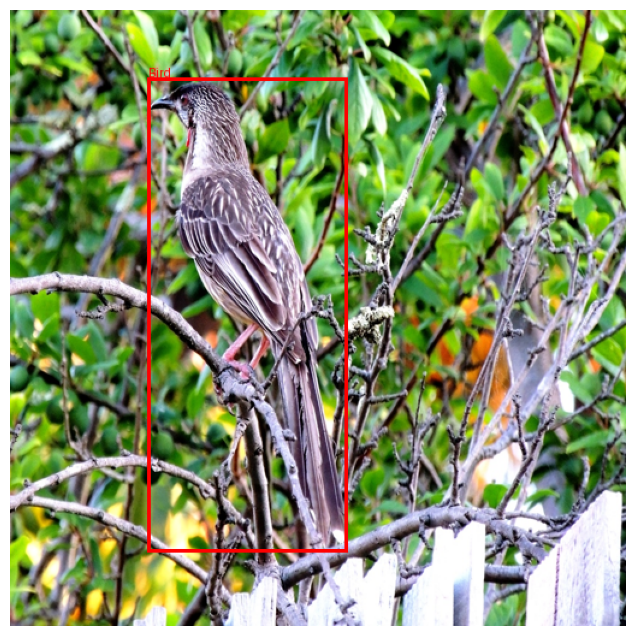

Image: /content/drive/MyDrive/Dataset/Dataset/train/Bird/001585b6966faee0.jpg
Bounding Box: [16.96, 71.084544, 501.76, 433.230848]
Image Dimensions: (512, 512)


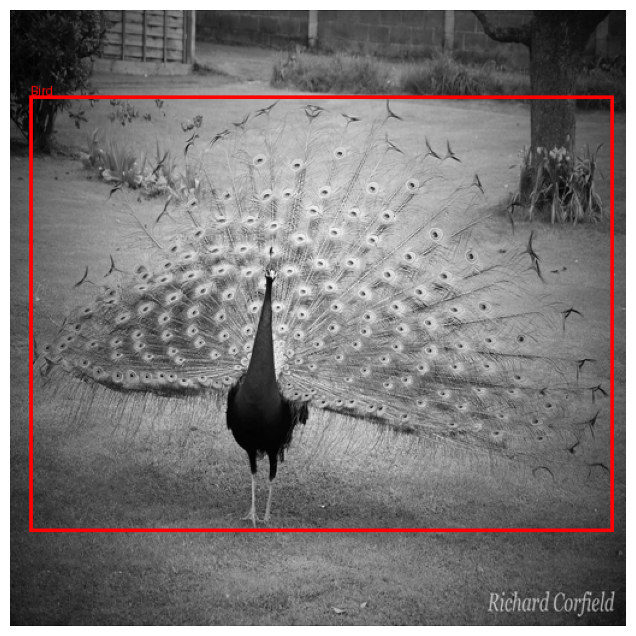

Image: /content/drive/MyDrive/Dataset/Dataset/train/Bird/00223b48f037a669.jpg
Bounding Box: [67.84, 36.022272, 353.92, 354.94195199999996]
Image Dimensions: (512, 512)


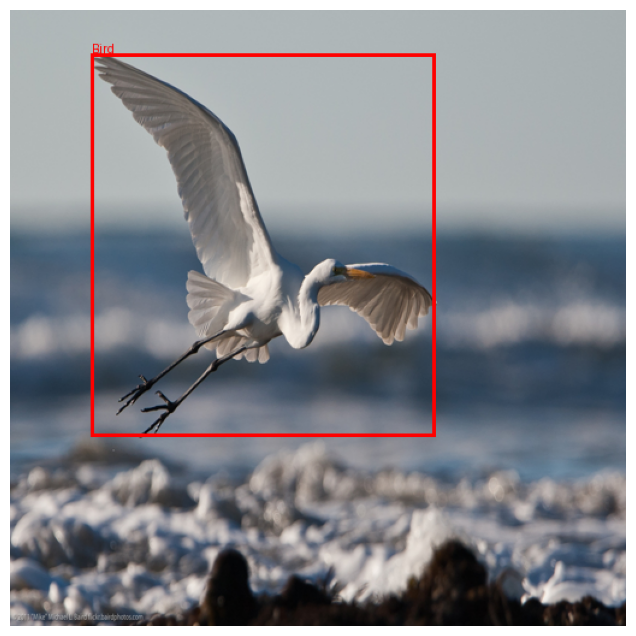

Image: /content/drive/MyDrive/Dataset/Dataset/train/Bird/006577201c3c192a.jpg
Bounding Box: [131.584, 133.802496, 354.816, 417.792]
Image Dimensions: (512, 512)


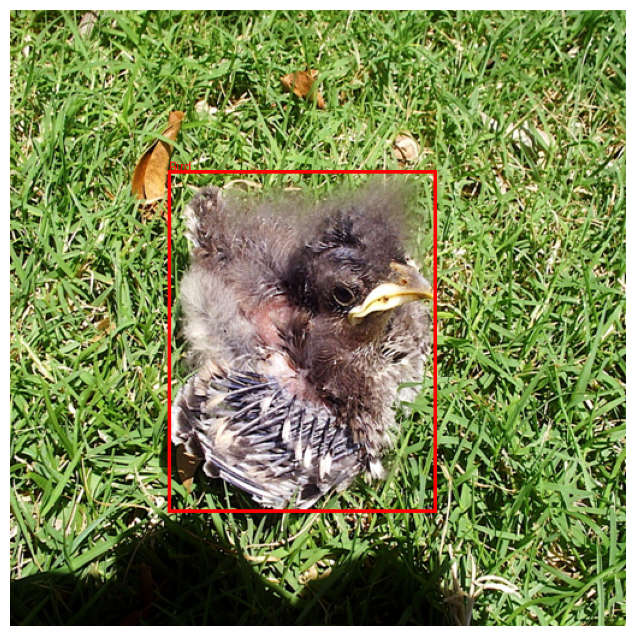

Image: /content/drive/MyDrive/Dataset/Dataset/train/Bird/0089637e75684dbd.jpg
Bounding Box: [96.32, 118.153728, 387.2, 448.600576]
Image Dimensions: (512, 512)


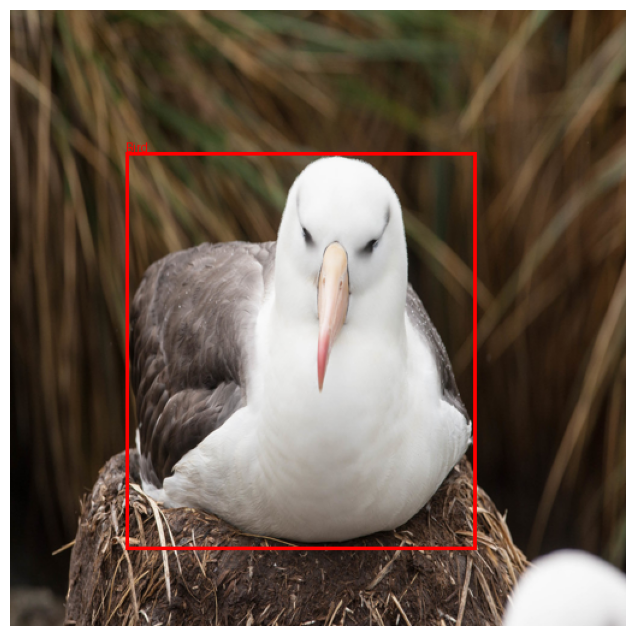

Image: /content/drive/MyDrive/Dataset/Dataset/train/Bird/0089637e75684dbd.jpg
Bounding Box: [406.08, 449.08083200000004, 511.68, 511.519744]
Image Dimensions: (512, 512)


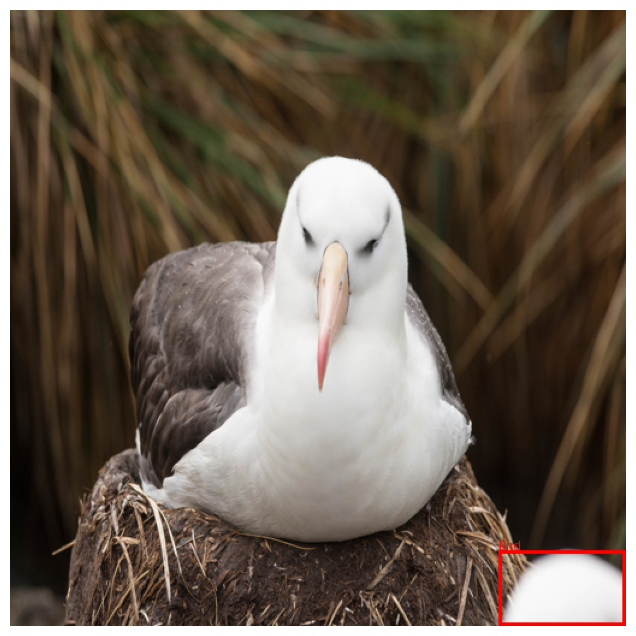

Image: /content/drive/MyDrive/Dataset/Dataset/train/Bird/00d159d96abc5f86.jpg
Bounding Box: [239.36, 207.306752, 272.32, 341.333504]
Image Dimensions: (512, 512)


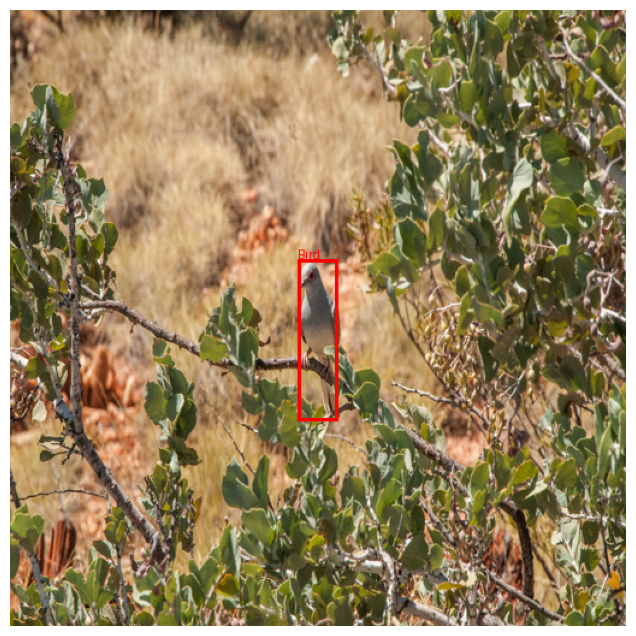

Image: /content/drive/MyDrive/Dataset/Dataset/train/Bird/0177407c660b1521.jpg
Bounding Box: [189.76, 219.090432, 233.28, 256.946176]
Image Dimensions: (512, 512)


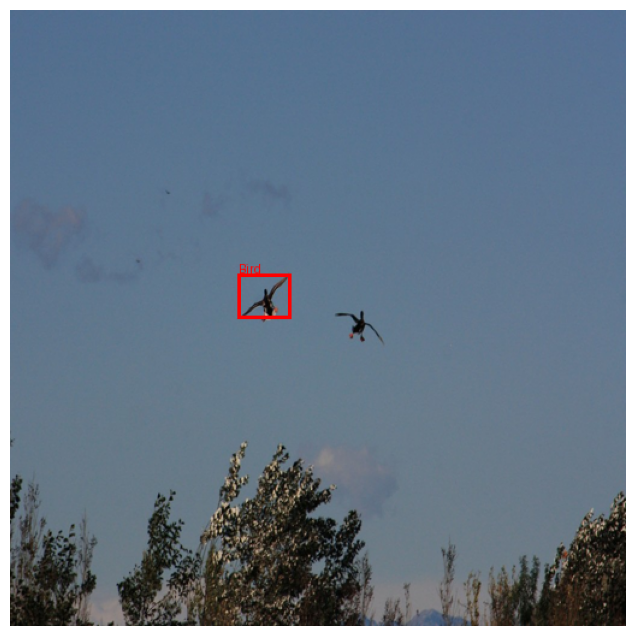

Image: /content/drive/MyDrive/Dataset/Dataset/train/Bird/0177407c660b1521.jpg
Bounding Box: [270.72, 247.955456, 306.88, 282.025984]
Image Dimensions: (512, 512)


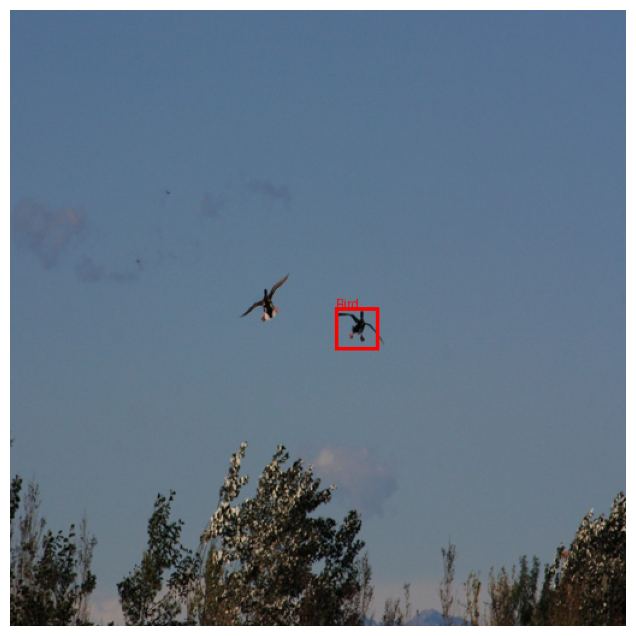

Image: /content/drive/MyDrive/Dataset/Dataset/train/Bird/030f4fa48d716489.jpg
Bounding Box: [138.88, 91.514368, 390.08, 417.1136]
Image Dimensions: (512, 512)


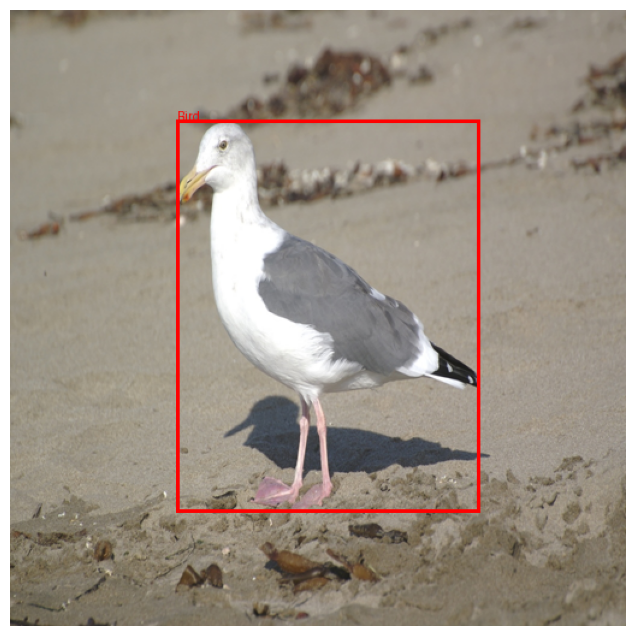

In [ ]:
train_dataset.visualize_bounding_boxes(num_images=10)

In [ ]:

# Load pretrained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(pretrained=True)

# Modify the classifier head
num_classes = len(class_map) + 1  # Add 1 for background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Move model to device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Define optimizer
# optimizer = optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0001, weight_decay=0.0001)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
num_batches = len(train_loader)
print(f"Number of batches: {num_batches}")
num_epochs = 10

for epoch in range(num_epochs): # Loop over each epoch for training
    model.train()
    epoch_loss = 0
    print(f"Starting Epoch {epoch + 1}/{num_epochs}...")

    for batch_idx, (images, targets) in enumerate(train_loader):
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        epoch_loss += losses.item()

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        if batch_idx % 10 == 0:  #print each 10 epochs
            print(f"Epoch [{epoch + 1}], Batch [{batch_idx + 1}/{num_batches}], Loss: {losses.item():.4f}")

    print(f"Epoch [{epoch + 1}/{num_epochs}], Total Loss: {epoch_loss:.4f}")


Number of batches: 187
Starting Epoch 1/10...
Epoch [1], Batch [1/187], Loss: 3.3466
Epoch [1], Batch [11/187], Loss: 0.6501
Epoch [1], Batch [21/187], Loss: 0.7570
Epoch [1], Batch [31/187], Loss: 0.7982
Epoch [1], Batch [41/187], Loss: 0.7343
Epoch [1], Batch [51/187], Loss: 0.6140
Epoch [1], Batch [61/187], Loss: 0.7724
Epoch [1], Batch [71/187], Loss: 0.5378
Epoch [1], Batch [81/187], Loss: 0.5314
Epoch [1], Batch [91/187], Loss: 0.4535
Epoch [1], Batch [101/187], Loss: 0.2997
Epoch [1], Batch [111/187], Loss: 0.5371
Epoch [1], Batch [121/187], Loss: 0.3509
Epoch [1], Batch [131/187], Loss: 0.4563
Epoch [1], Batch [141/187], Loss: 0.3906
Epoch [1], Batch [151/187], Loss: 0.3407
Epoch [1], Batch [161/187], Loss: 0.3766
Epoch [1], Batch [171/187], Loss: 0.3500
Epoch [1], Batch [181/187], Loss: 0.4511
Epoch [1/10], Total Loss: 104.9315
Starting Epoch 2/10...
Epoch [2], Batch [1/187], Loss: 0.3887
Epoch [2], Batch [11/187], Loss: 0.2523
Epoch [2], Batch [21/187], Loss: 0.2074
Epoch [2]

## **Model Evaluation**

This section defines the evaluation function for the trained Faster R-CNN model.  
It calculates the following performance metrics on the test set:
- **Mean Average Precision (mAP)**
- **Precision**
- **Recall**

### **Evaluation Details:**
- Uses IoU (Intersection over Union) for bounding box matching.
- A prediction is considered a True Positive if its IoU with the ground truth box exceeds a defined threshold (`iou_threshold=0.6`).
- Calculates per-image precision and recall, then computes the mean across all images.

Finally, the evaluation metrics are printed for the test dataset.


In [ ]:
from torchvision.ops import box_iou
from collections import defaultdict

def evaluate_faster_rcnn(model, dataloader, device, iou_threshold=0.6):
    """
    Evaluate Faster R-CNN model on a given dataset.

    Parameters:
        model: Trained Faster R-CNN model.
        dataloader: DataLoader for the evaluation dataset.
        device: Device (e.g., "cuda" or "cpu").
        iou_threshold: IoU threshold to consider a detection as True Positive.

    Returns:
        metrics: Dictionary containing mAP, precision, and recall.
    """
    model.eval()
    true_positive = 0
    false_positive = 0
    false_negative = 0
    all_precisions = []
    all_recalls = []
    all_ious = []

    for images, targets in dataloader:
        # Move data to the device
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            predictions = model(images)

        for target, prediction in zip(targets, predictions):
            # Actual and predicted bounding boxes
            gt_boxes = target["boxes"]
            pred_boxes = prediction["boxes"]
            pred_scores = prediction["scores"]
            pred_labels = prediction["labels"]

            # Filter bounding boxes based on the threshold
            selected_indices = pred_scores > 0.5
            pred_boxes = pred_boxes[selected_indices]
            pred_labels = pred_labels[selected_indices]

            # Calculate IoU between ground truth and predicted boxes
            ious = box_iou(gt_boxes, pred_boxes)
            all_ious.append(ious)

            # Match boxes based on IoU
            for i in range(len(gt_boxes)):
                if len(ious[i]) == 0:
                    false_negative += 1
                else:
                    max_iou, max_index = ious[i].max(0)
                    if max_iou > iou_threshold:
                        true_positive += 1
                    else:
                        false_positive += 1

        # Calculate precision and recall for each image
        precision = true_positive / (true_positive + false_positive) if (true_positive + false_positive) > 0 else 0
        recall = true_positive / (true_positive + false_negative) if (true_positive + false_negative) > 0 else 0

        all_precisions.append(precision)
        all_recalls.append(recall)

    # Calculate mAP
    mean_ap = sum(all_precisions) / len(all_precisions)

    metrics = {
        "mAP": mean_ap,
        "precision": sum(all_precisions) / len(all_precisions),
        "recall": sum(all_recalls) / len(all_recalls)
    }
    return metrics


In [ ]:
# Define the device for execution (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Evaluate the model
metrics = evaluate_faster_rcnn(model, test_loader, device)
print(f"mAP: {metrics['mAP']:.4f}")
print(f"Precision: {metrics['precision']:.4f}")
print(f"Recall: {metrics['recall']:.4f}")


mAP: 0.7419
Precision: 0.7419
Recall: 0.9979


## **Visualizing Random Model Predictions**

This section provides a function to visualize random predictions made by the trained Faster R-CNN model on the dataset.  

### **Key Features:**
- **Random Sampling:** Randomly selects images from the dataset for visualization.
- **Diverse Class Coverage:** Ensures multiple classes are included in the visualized images.
- **Bounding Box Drawing:** Draws predicted bounding boxes with class labels and confidence scores (only predictions with confidence > 0.7 are displayed).
- **Class Distribution:** Prints the count of each class present in the visualized samples.



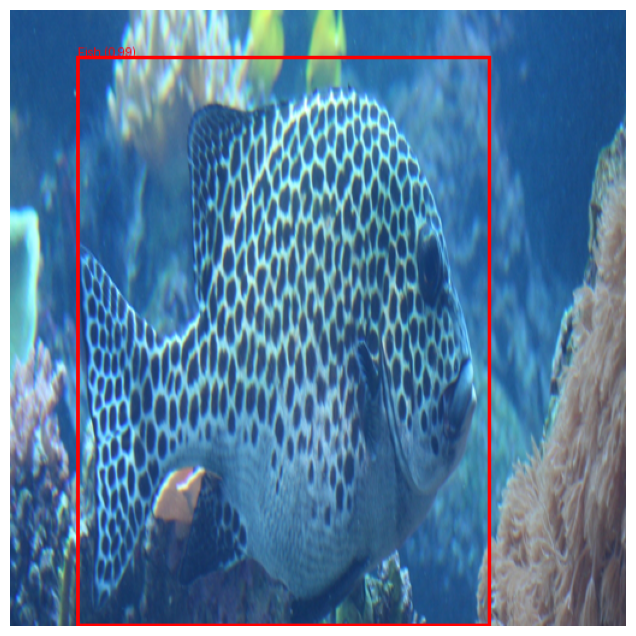

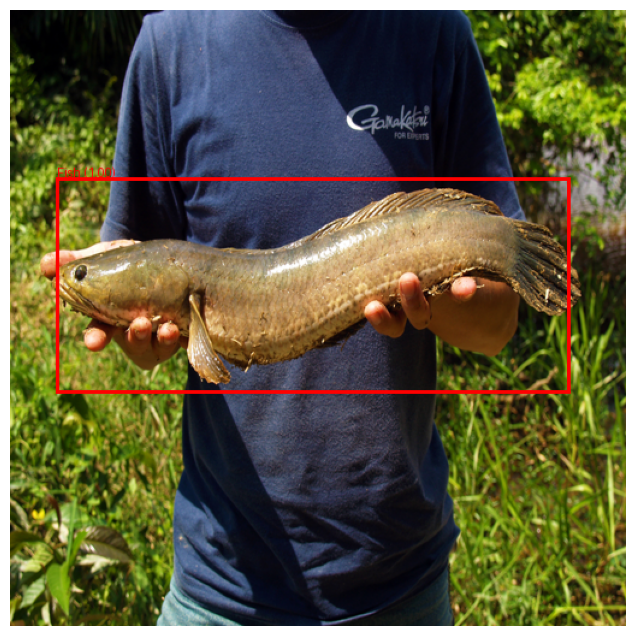

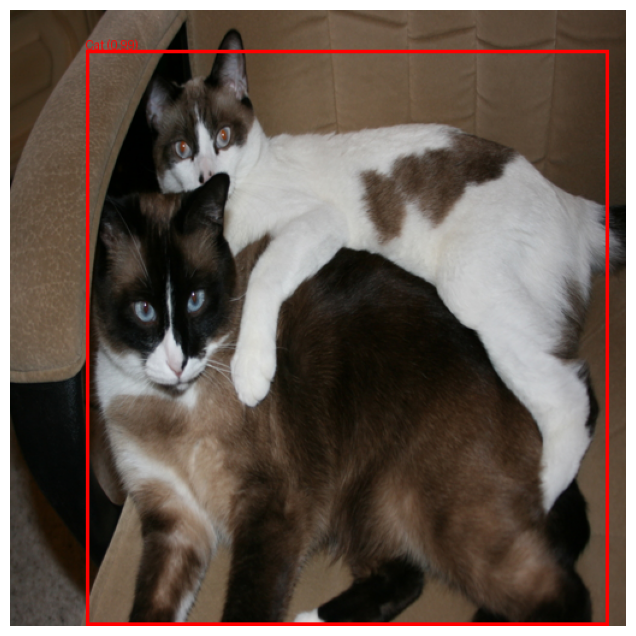

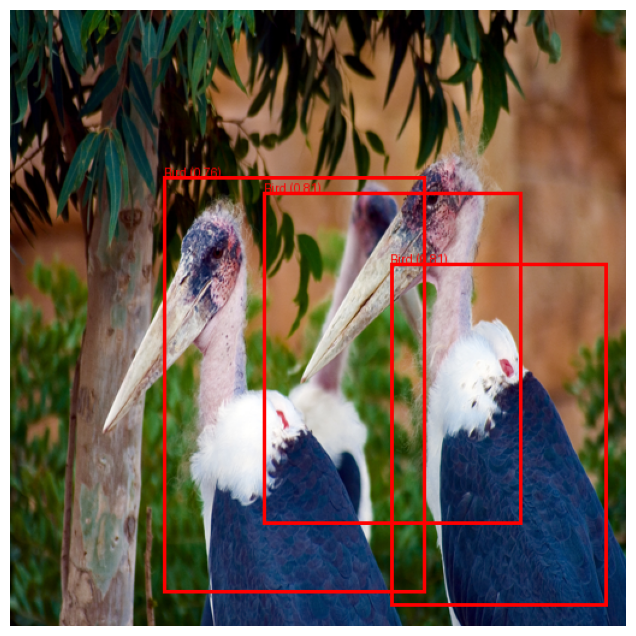

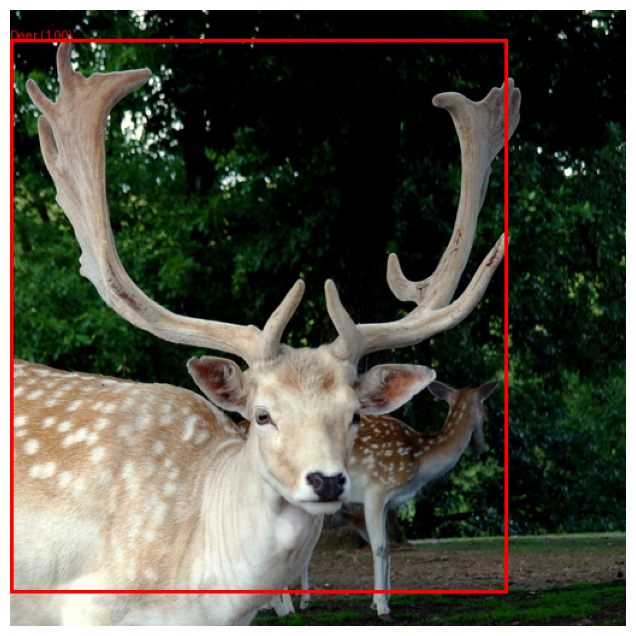

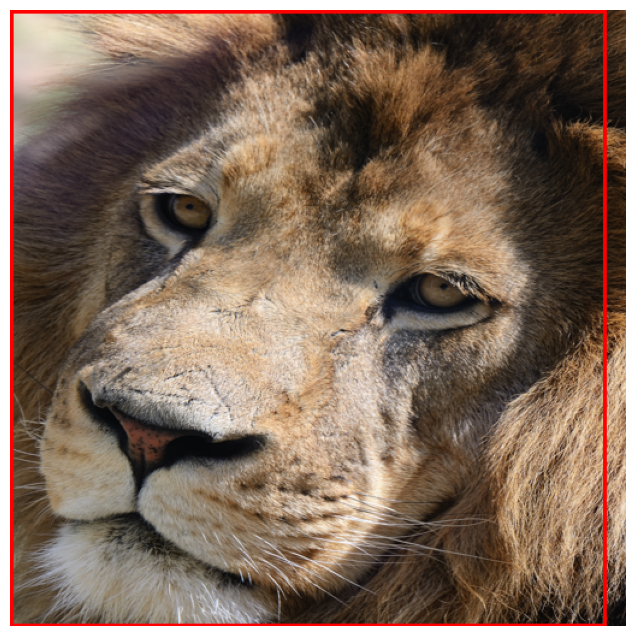

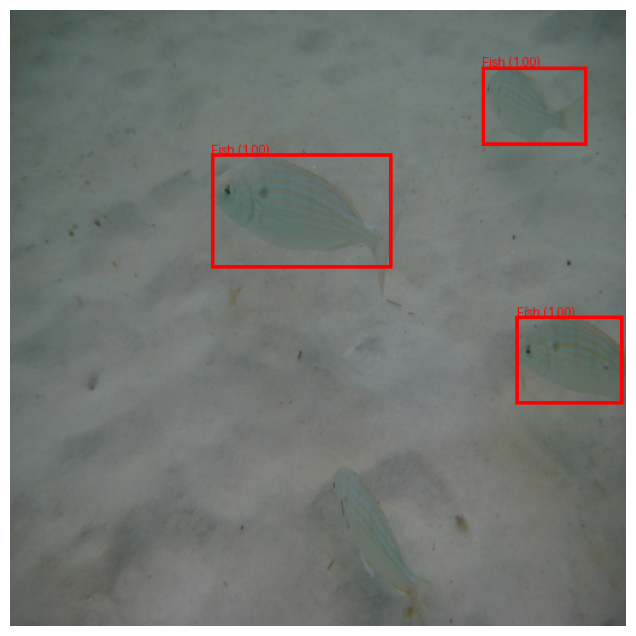

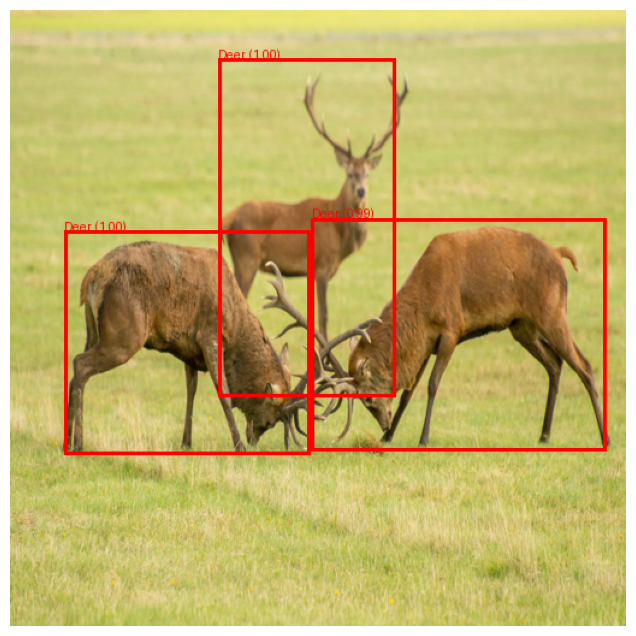

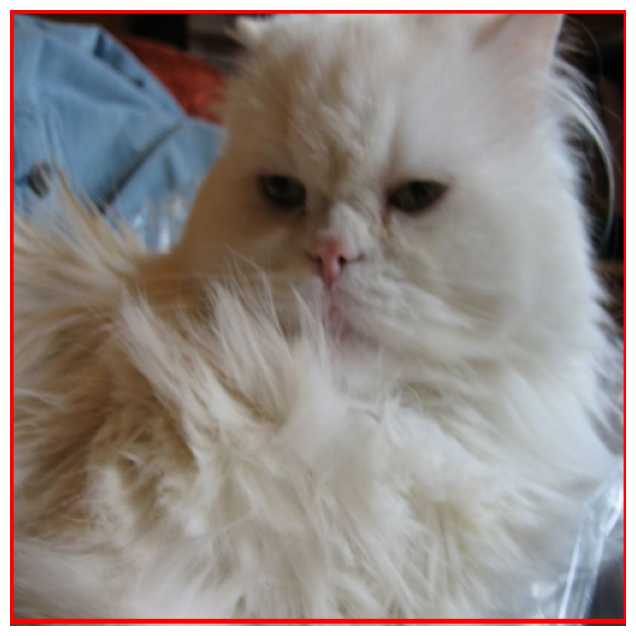

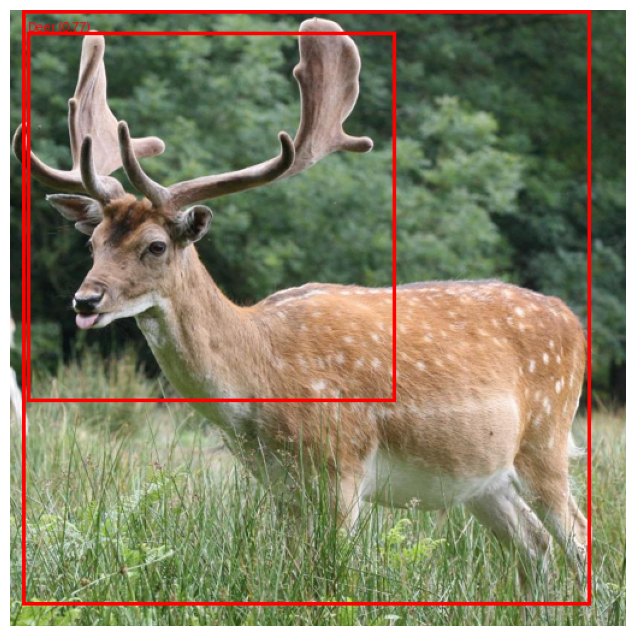

Visualized Classes:
Fish: 5
Cat: 2
Bird: 3
Deer: 6
Dog: 2


In [ ]:
import random
from collections import defaultdict

def visualize_random_predictions(model, dataset, device, id_to_class, num_images=5):
    """
    Visualize random predictions from the dataset, ensuring multiple classes are included.

    Args:
        model: Trained Faster R-CNN model.
        dataset: Dataset object.
        device: Device (CPU or GPU).
        id_to_class: Mapping of class IDs to class names.
        num_images: Number of random images to visualize.
    """
    model.eval()

    # Track visualized classes to ensure diversity
    visualized_classes = defaultdict(int)

    # Randomly shuffle indices
    indices = list(range(len(dataset)))
    random.shuffle(indices)

    # Visualize up to `num_images`
    count = 0
    for idx in indices:
        if count >= num_images:
            break

        image, target = dataset[idx]
        image = image.to(device)

        with torch.no_grad():
            prediction = model([image])[0]

        # Convert image to PIL for drawing
        img = F.to_pil_image(image.cpu())
        draw = ImageDraw.Draw(img)

        # Draw predicted bounding boxes
        for box, label, score in zip(prediction['boxes'], prediction['labels'], prediction['scores']):
            if score > 0.7:  # Confidence threshold
                xmin, ymin, xmax, ymax = box.tolist()
                class_name = id_to_class.get(label.item(), "Unknown")
                visualized_classes[class_name] += 1

                draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=3)
                draw.text((xmin, ymin - 10), f"{class_name} ({score:.2f})", fill="red")

        # Display the image
        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        plt.axis("off")
        plt.show()

        count += 1

    # Print class distribution of visualized images
    print("Visualized Classes:")
    for class_name, count in visualized_classes.items():
        print(f"{class_name}: {count}")

id_to_class = {v: k for k, v in class_map.items()}

visualize_random_predictions(model, test_dataset, device, id_to_class, num_images=10)
